## A Line Plot

In [1]:
mvt = read.csv('./dataset/mvt.csv', stringsAsFactors = FALSE)
str(mvt)

'data.frame':	191641 obs. of  3 variables:
 $ Date     : chr  "12/31/12 23:15" "12/31/12 22:00" "12/31/12 22:00" "12/31/12 22:00" ...
 $ Latitude : num  41.8 41.9 42 41.8 41.8 ...
 $ Longitude: num  -87.6 -87.7 -87.8 -87.7 -87.6 ...


In [2]:
mvt$Date = strptime(mvt$Date, format="%m/%d/%y %H:%M")

In [3]:
mvt$Weekday = weekdays(mvt$Date)
mvt$Hour = mvt$Date$hour

In [4]:
str(mvt)

'data.frame':	191641 obs. of  5 variables:
 $ Date     : POSIXlt, format: "2012-12-31 23:15:00" "2012-12-31 22:00:00" ...
 $ Latitude : num  41.8 41.9 42 41.8 41.8 ...
 $ Longitude: num  -87.6 -87.7 -87.8 -87.7 -87.6 ...
 $ Weekday  : chr  "월요일" "월요일" "월요일" "월요일" ...
 $ Hour     : int  23 22 22 22 21 20 20 20 19 18 ...


In [5]:
table(mvt$Weekday)


금요일 목요일 수요일 월요일 일요일 토요일 화요일 
 29284  27319  27416  27397  26316  27118  26791 

In [6]:
WeekdayCounts = as.data.frame(table(mvt$Weekday))

In [7]:
str(WeekdayCounts)

'data.frame':	7 obs. of  2 variables:
 $ Var1: Factor w/ 7 levels "금요일","목요일",..: 1 2 3 4 5 6 7
 $ Freq: int  29284 27319 27416 27397 26316 27118 26791


In [8]:
library(ggplot2)

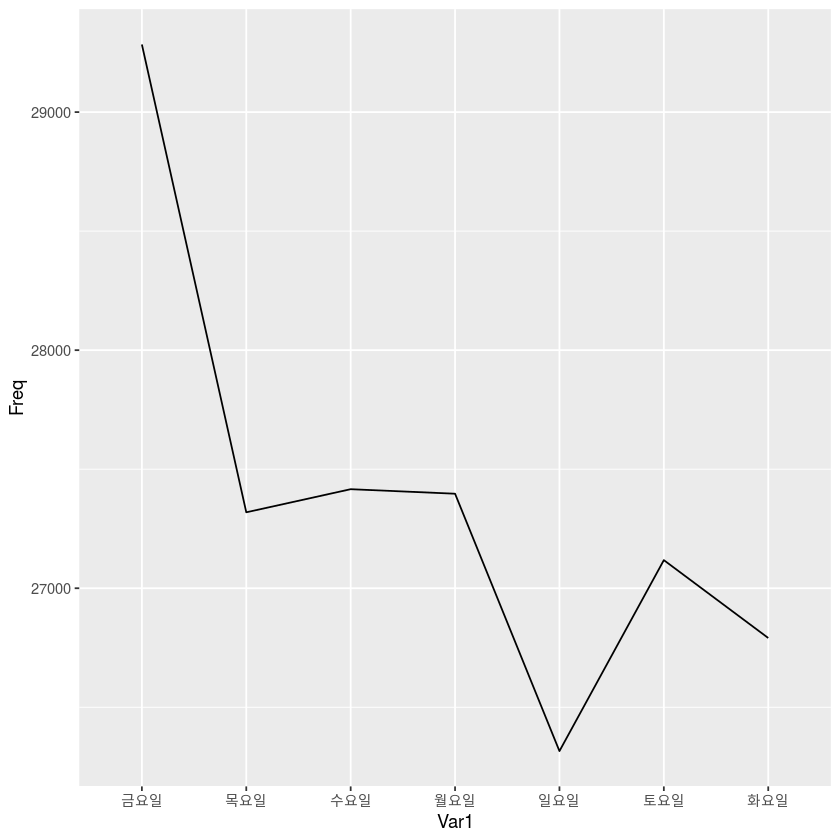

In [9]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq)) + geom_line(aes(group=1))

If you want to print it with English, you need to set syslocal:
```R
Sys.setlocale("LC_ALL", "C")
```

In [10]:
WeekdayCounts$Var1 = factor(WeekdayCounts$Var1, ordered=TRUE, 
                            levels=c("일요일", "월요일", "화요일", "수요일", "목요일", "금요일", "토요일"))

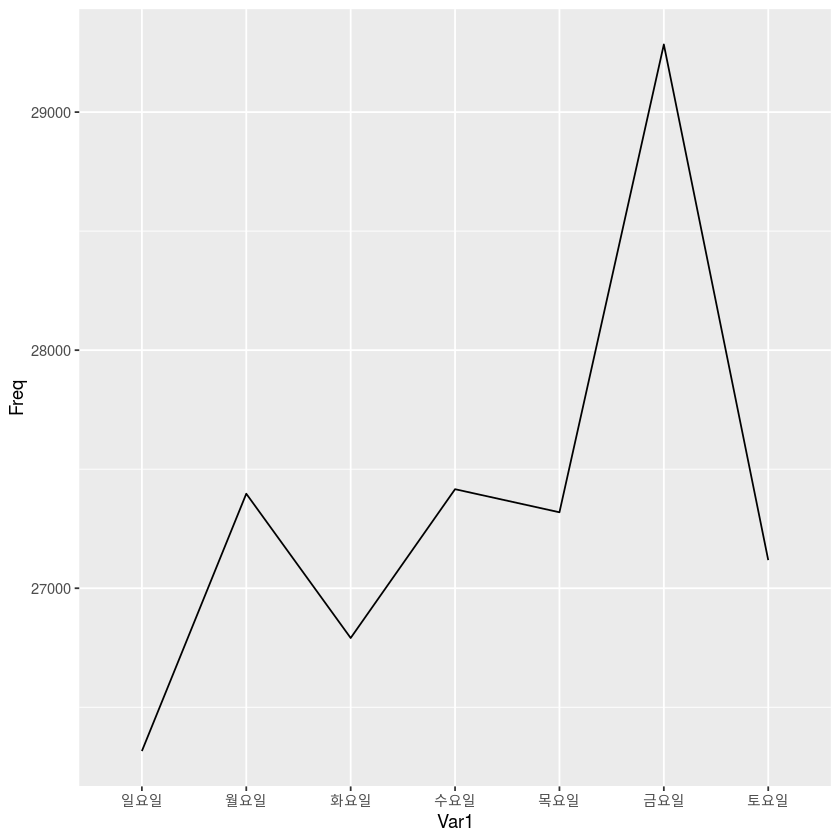

In [11]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq)) + geom_line(aes(group=1))

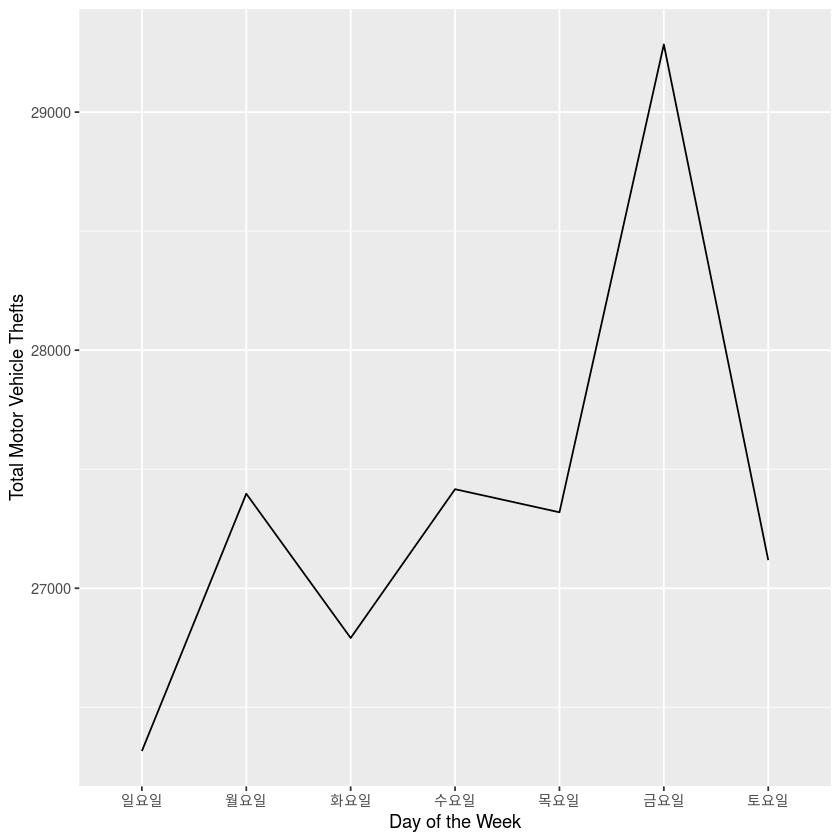

In [12]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq)) + 
geom_line(aes(group=1)) + 
xlab("Day of the Week") + 
ylab("Total Motor Vehicle Thefts")

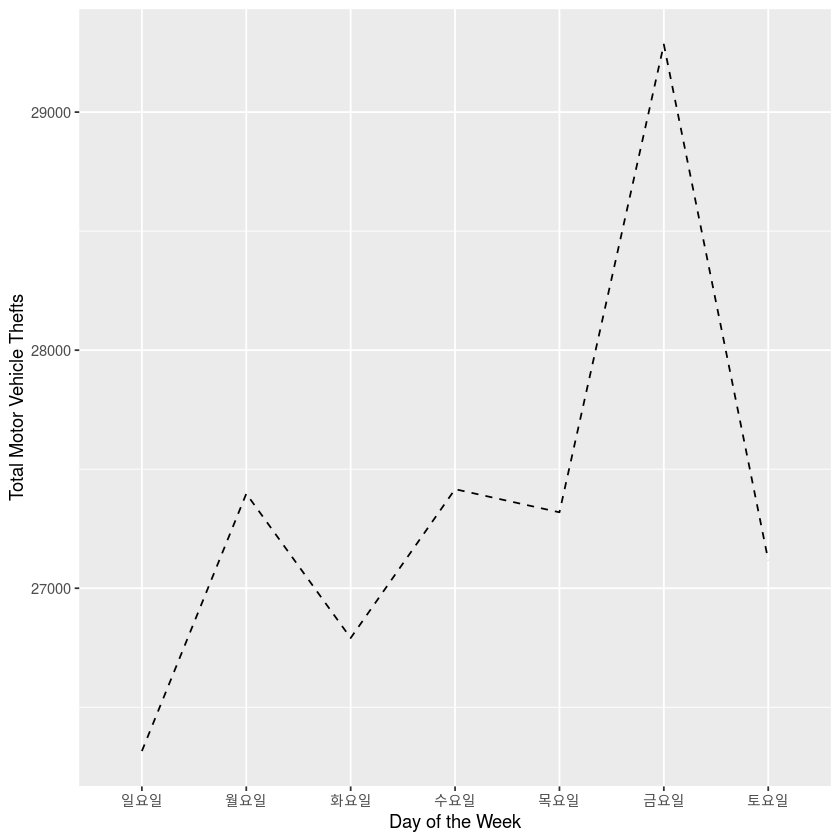

In [13]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq)) + 
geom_line(aes(group=1), linetype=2) + 
xlab("Day of the Week") + 
ylab("Total Motor Vehicle Thefts")

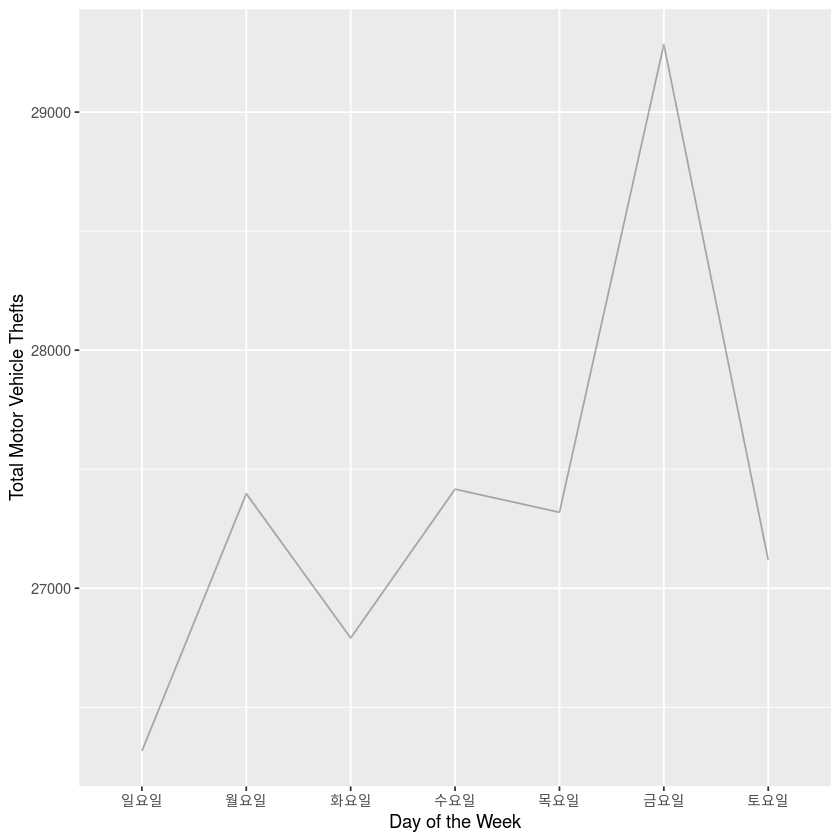

In [14]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq)) + 
geom_line(aes(group=1), alpha=0.3) + 
xlab("Day of the Week") + 
ylab("Total Motor Vehicle Thefts")

## A Heatmap

In [15]:
table(mvt$Weekday, mvt$Hour)

        
            0    1    2    3    4    5    6    7    8    9   10   11   12   13
  금요일 1873  932  743  560  473  602  839 1203 1268 1286  938  822 1207  857
  목요일 1856  816  696  508  400  534  799 1135 1298 1301  932  731 1093  752
  수요일 1814  790  619  469  396  561  862 1140 1329 1237  947  763 1225  804
  월요일 1900  825  712  527  415  542  772 1123 1323 1235  971  737 1129  824
  일요일 2028 1236 1019  838  607  461  478  483  615  864  884  787 1192  789
  토요일 2050 1267  985  836  652  508  541  650  858 1039  946  789 1204  767
  화요일 1691  777  603  464  414  520  845 1118 1175 1174  948  786 1108  762
        
           14   15   16   17   18   19   20   21   22   23
  금요일  937 1140 1165 1318 1623 1652 1736 1881 2308 1921
  목요일  831 1044 1131 1258 1510 1537 1668 1776 2134 1579
  수요일  863 1075 1076 1289 1580 1507 1718 1748 2093 1511
  월요일  958 1059 1136 1252 1518 1503 1622 1815 2009 1490
  일요일  959 1037 1083 1160 1389 1342 1706 1696 2079 1584
  토요일  963 1086 1055 1084 1348 1

In [16]:
DayHourCounts = as.data.frame(table(mvt$Weekday, mvt$Hour))

In [17]:
str(DayHourCounts)

'data.frame':	168 obs. of  3 variables:
 $ Var1: Factor w/ 7 levels "금요일","목요일",..: 1 2 3 4 5 6 7 1 2 3 ...
 $ Var2: Factor w/ 24 levels "0","1","2","3",..: 1 1 1 1 1 1 1 2 2 2 ...
 $ Freq: int  1873 1856 1814 1900 2028 2050 1691 932 816 790 ...


In [18]:
DayHourCounts$Hour = as.numeric(as.character(DayHourCounts$Var2))

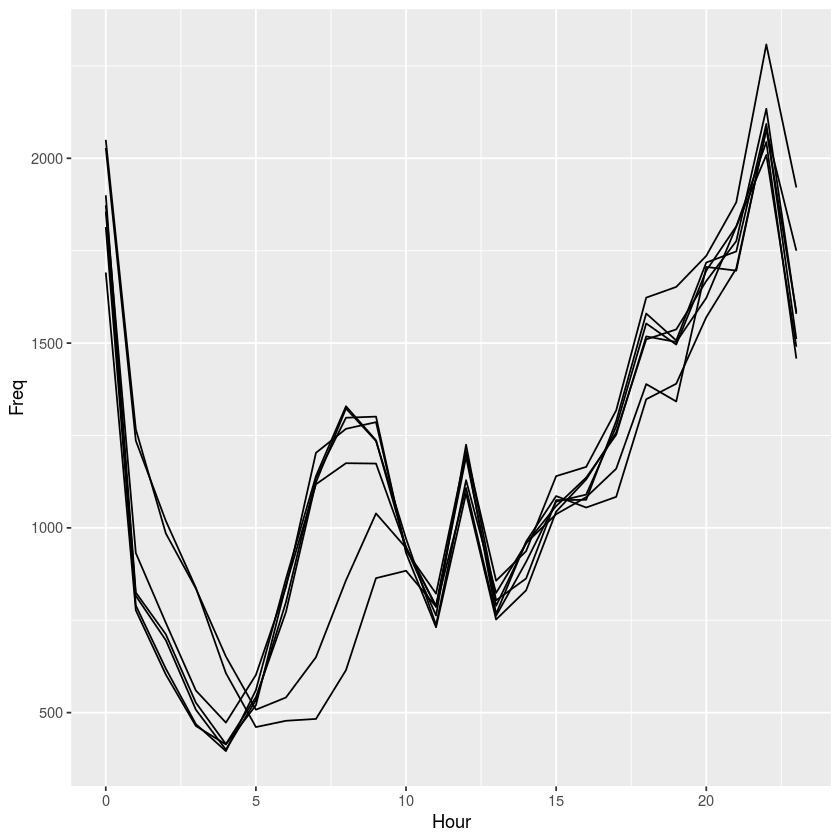

In [19]:
ggplot(DayHourCounts, aes(x = Hour, y = Freq)) + geom_line(aes(group = Var1))

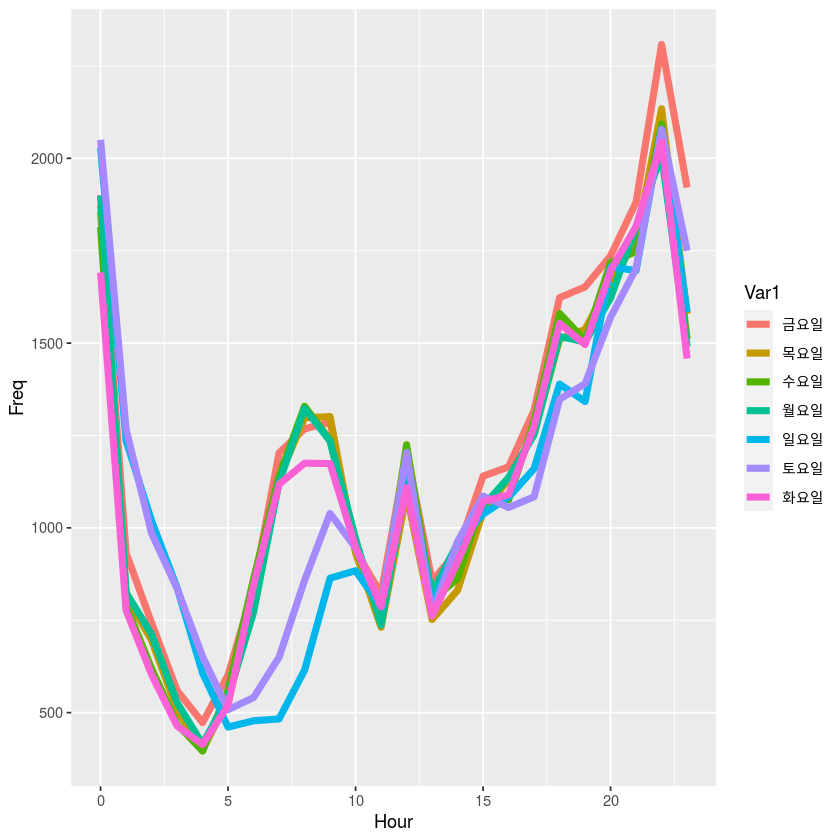

In [20]:
ggplot(DayHourCounts, aes(x = Hour, y = Freq)) + geom_line(aes(group = Var1, color=Var1), size=2)

In [21]:
DayHourCounts$Var1 = factor(DayHourCounts$Var1, ordered=TRUE, 
                            levels=c("월요일","화요일", "수요일", "목요일", "금요일", "토요일", "일요일"))

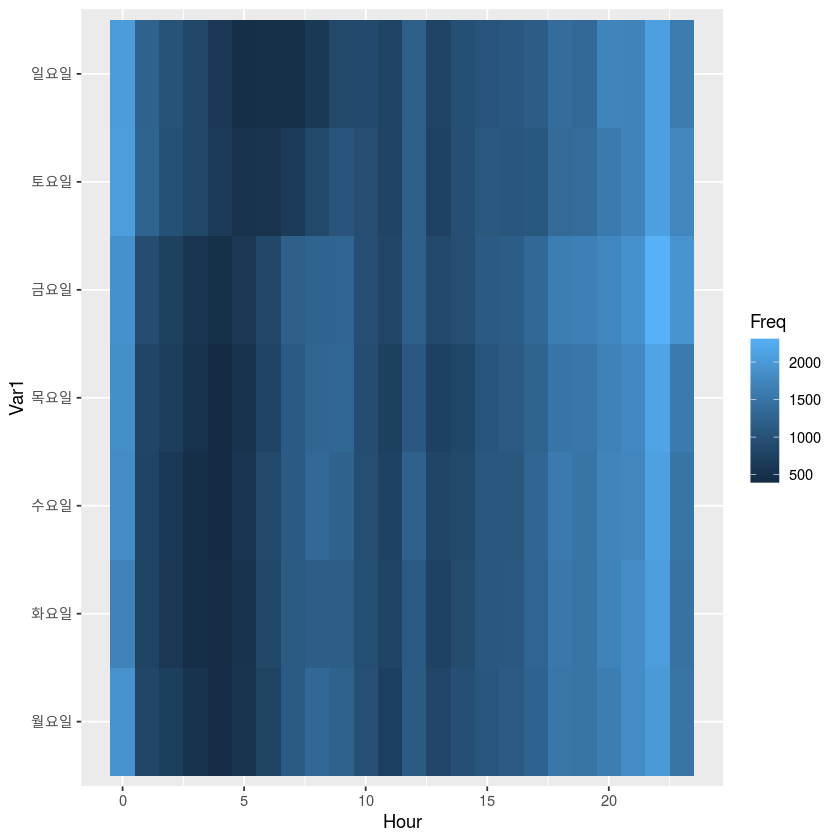

In [22]:
ggplot(DayHourCounts, aes(x= Hour, y = Var1)) + geom_tile(aes(fill=Freq))

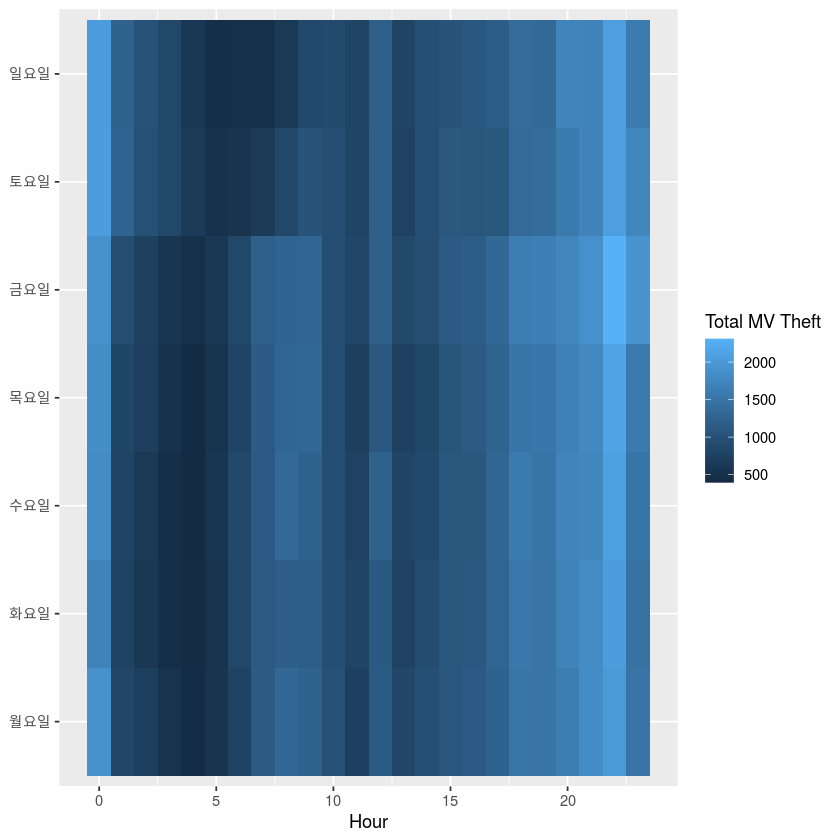

In [23]:
ggplot(DayHourCounts, aes(x= Hour, y = Var1)) + 
geom_tile(aes(fill=Freq)) + 
scale_fill_gradient(name="Total MV Theft") + 
theme(axis.title.y = element_blank())

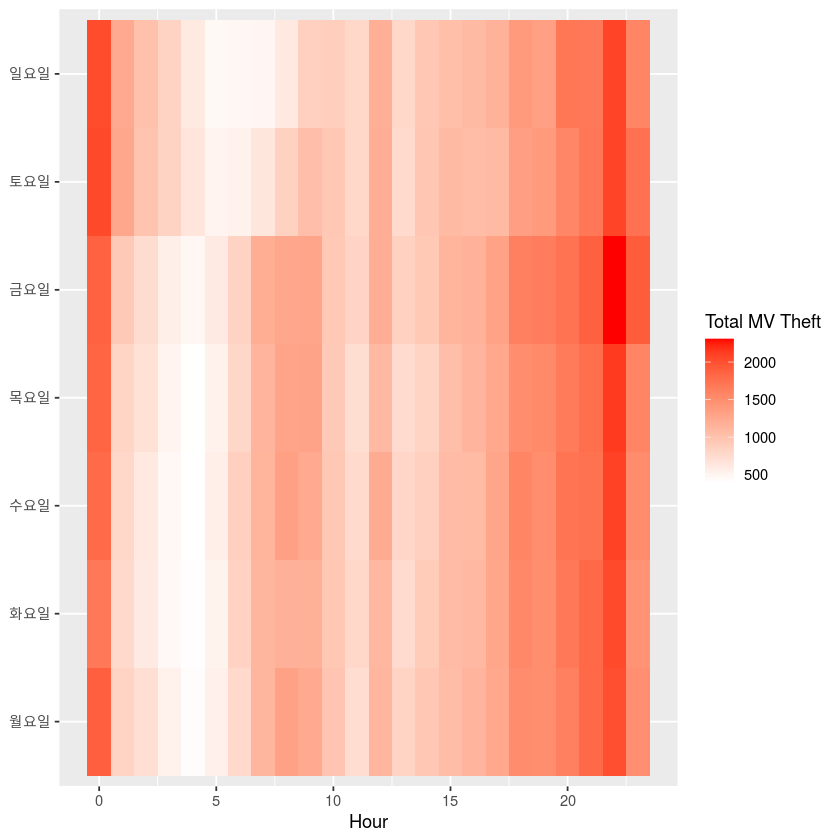

In [24]:
ggplot(DayHourCounts, aes(x= Hour, y = Var1)) + 
geom_tile(aes(fill=Freq)) + 
scale_fill_gradient(name="Total MV Theft", low="white", high="red") + 
theme(axis.title.y = element_blank())

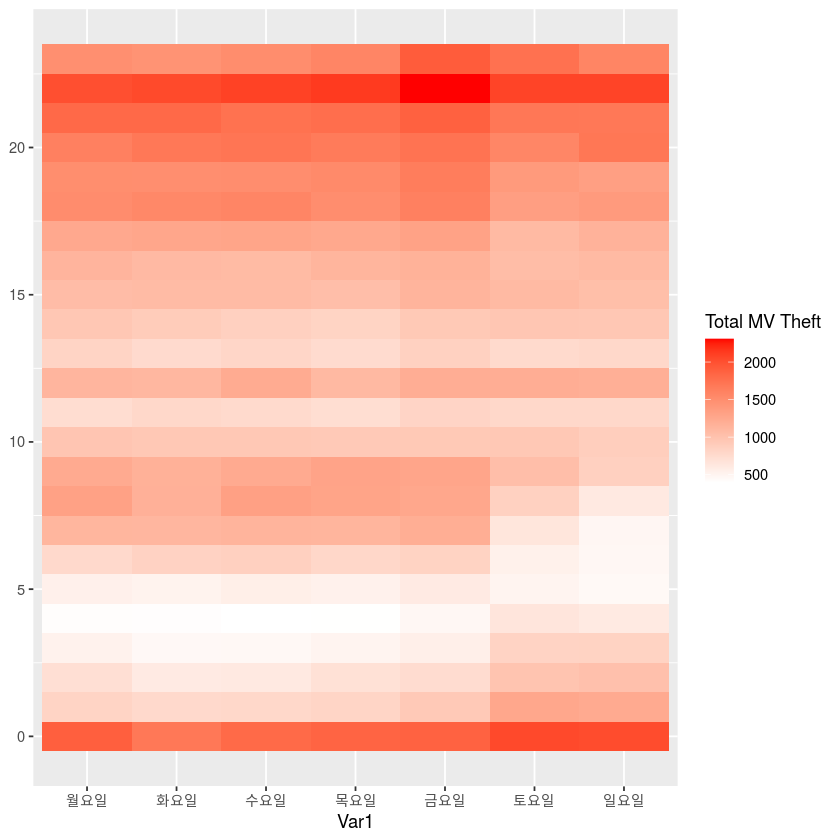

In [25]:
ggplot(DayHourCounts, aes(x= Var1, y = Hour)) + 
geom_tile(aes(fill=Freq)) + 
scale_fill_gradient(name="Total MV Theft", low="white", high="red") + 
theme(axis.title.y = element_blank())

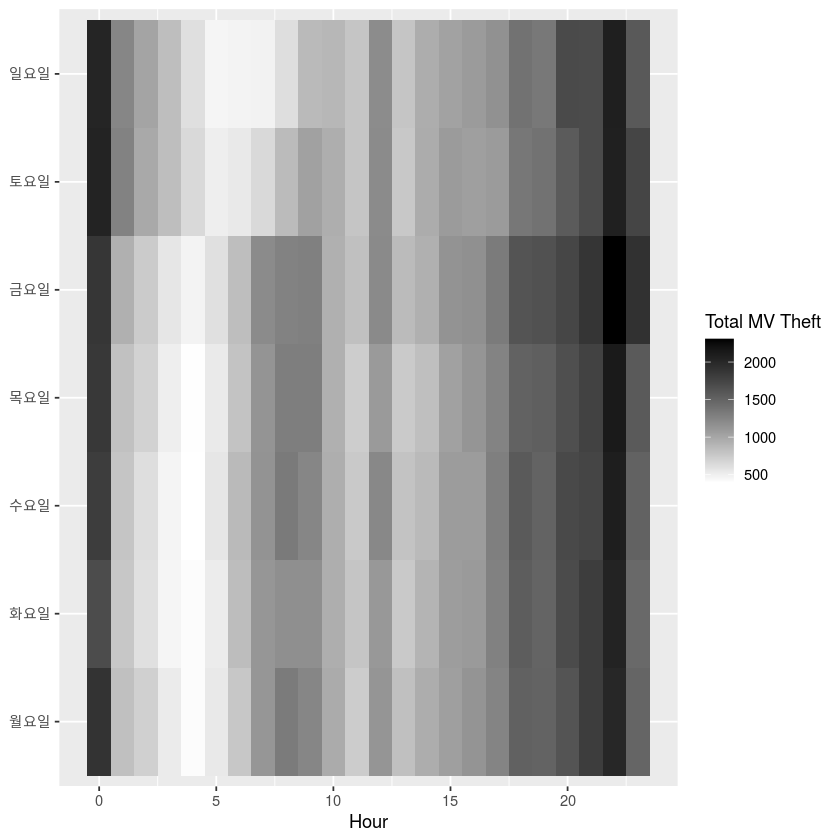

In [26]:
ggplot(DayHourCounts, aes(x= Hour, y = Var1)) + 
geom_tile(aes(fill=Freq)) + 
scale_fill_gradient(name="Total MV Theft", low="white", high="black") + 
theme(axis.title.y = element_blank())

## A Geographical Hot Spot Map

Requires to install ggmap:
```R
if(!requireNamespace("devtools")) 
    install.packages("devtools") 
devtools::install_github("dkahle/ggmap", ref = "tidyup", force = TRUE)
```
Then, Get Google API from [Google APIs](https://console.developers.google.com/apis)
And Enable **Maps Static API** and **geocoding API**
Then, Go to the geocoding API that you have enabled. Click on credentials and ask for a key. Copy this key.
And Register API key to ggmap
```R
library(ggmap) 
register_google(key = "yourAPI")
```
Also, it requires to install:
```R
install.packages("maps")
```

In [27]:
library(ggmap)

Google's Terms of Service: https://cloud.google.com/maps-platform/terms/.

Please cite ggmap if you use it! See citation("ggmap") for details.



In [33]:
library(maps)
# register_google(key = "XXX")

In [34]:
chicago = get_map(location="chicago", zoom=11)

Source : https://maps.googleapis.com/maps/api/staticmap?center=chicago&zoom=11&size=640x640&scale=2&maptype=terrain&language=en-EN&key=xxx

Source : https://maps.googleapis.com/maps/api/geocode/json?address=chicago&key=xxx



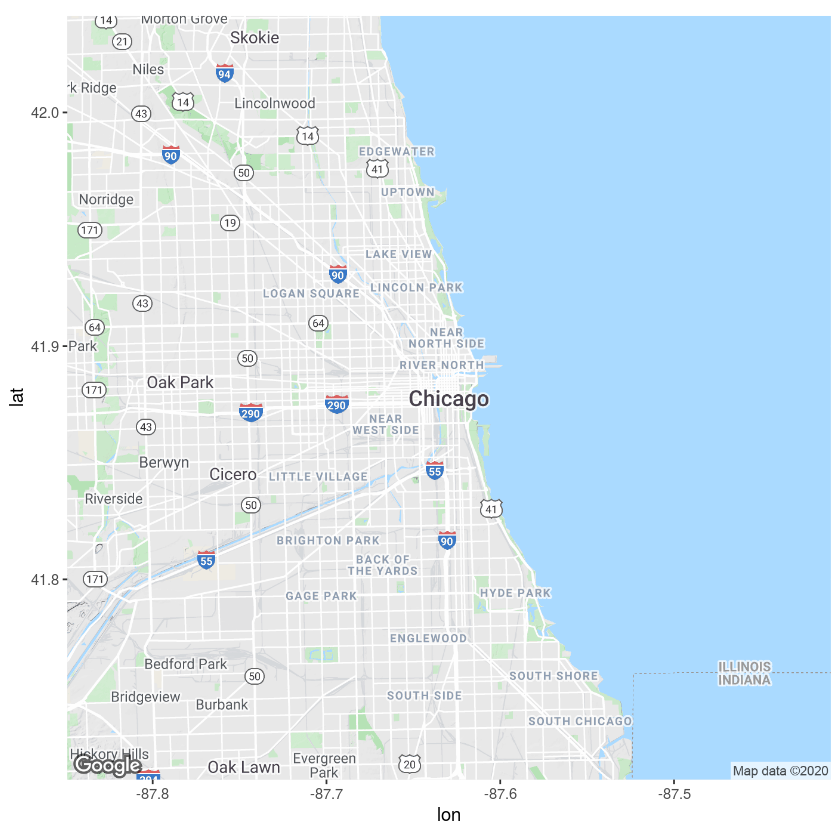

In [35]:
ggmap(chicago)

Warning message:
“Removed 7 rows containing missing values (geom_point).”


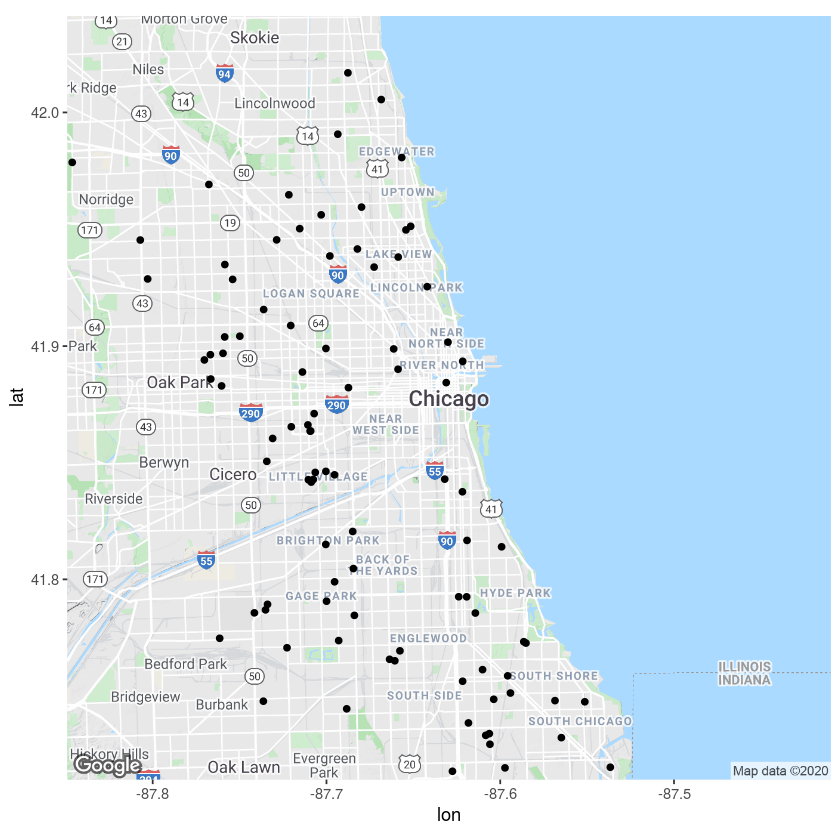

In [36]:
ggmap(chicago) + geom_point(data=mvt[1:100, ], aes(x=Longitude, y= Latitude))

In [37]:
LatLonCounts = as.data.frame(table(round(mvt$Longitude, 2), round(mvt$Latitude, 2)))

In [38]:
str(LatLonCounts)

'data.frame':	1638 obs. of  3 variables:
 $ Var1: Factor w/ 42 levels "-87.93","-87.92",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Var2: Factor w/ 39 levels "41.64","41.65",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Freq: int  0 0 0 0 0 0 0 0 0 0 ...


In [39]:
LatLonCounts$Long = as.numeric(as.character(LatLonCounts$Var1))
LatLonCounts$Lat = as.numeric(as.character(LatLonCounts$Var2))

Warning message:
“Removed 615 rows containing missing values (geom_point).”


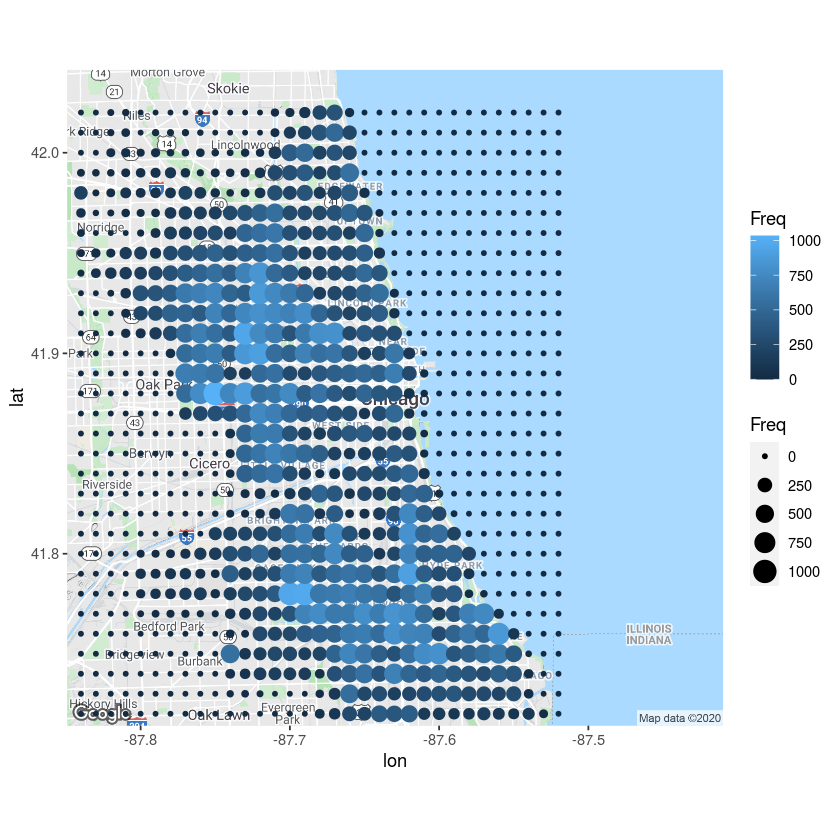

In [40]:
ggmap(chicago) + geom_point(data=LatLonCounts, aes(x = Long, y=Lat, color=Freq, size=Freq))

Warning message:
“Removed 615 rows containing missing values (geom_point).”


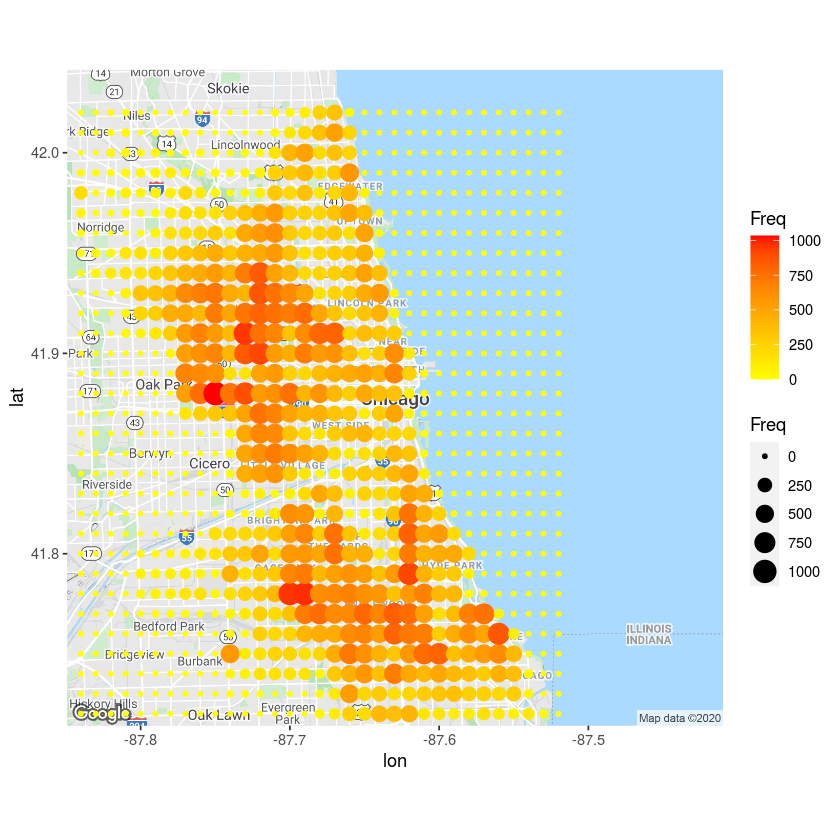

In [41]:
ggmap(chicago) + 
geom_point(data=LatLonCounts, aes(x = Long, y=Lat, color=Freq, size=Freq)) + 
scale_color_gradient(low='yellow', high='red')

Warning message:
“Removed 615 rows containing missing values (geom_tile).”


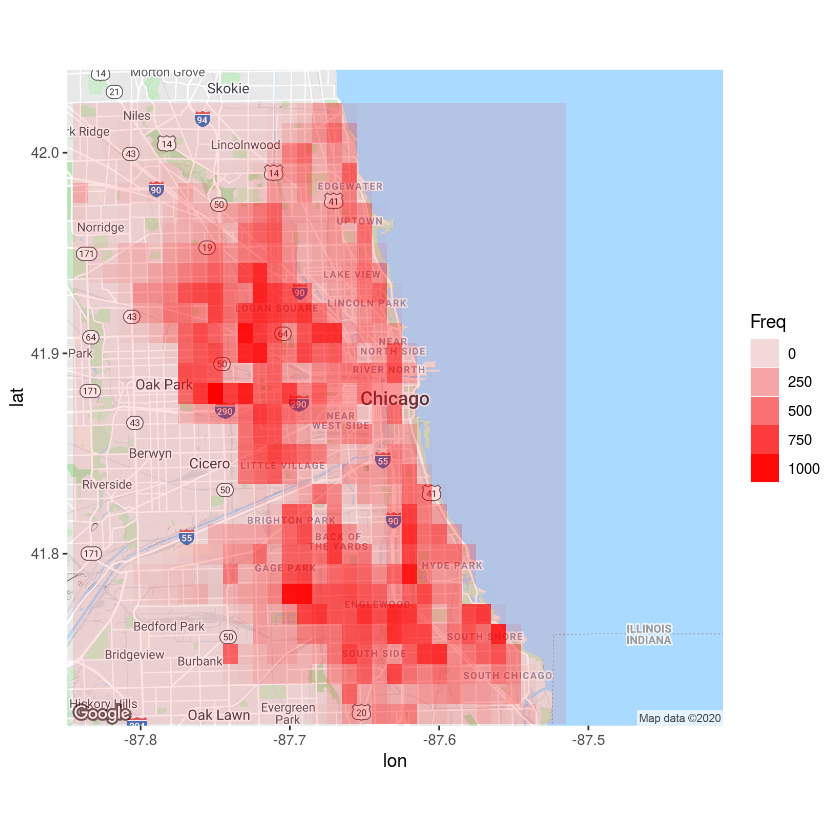

In [42]:
ggmap(chicago) + 
geom_tile(data=LatLonCounts, aes(x=Long, y=Lat, alpha=Freq), fill="red")

### Quick Question
In the previous video, our heatmap was plotting squares out in the water, which seems a little strange. We can fix this by removing the observations from our data frame that have Freq = 0.

Take a subset of LatLonCounts, only keeping the observations for which Freq > 0, and call it LatLonCounts2.

If you redo the heatmap from the end of Video 5, using LatLonCounts2 instead of LatLonCounts, then you should no longer see any squares out in the water, or in any areas where there were no motor vehicle thefts.

In [43]:
LatLonCounts2 = subset(LatLonCounts, Freq > 0)

Warning message:
“Removed 119 rows containing missing values (geom_tile).”


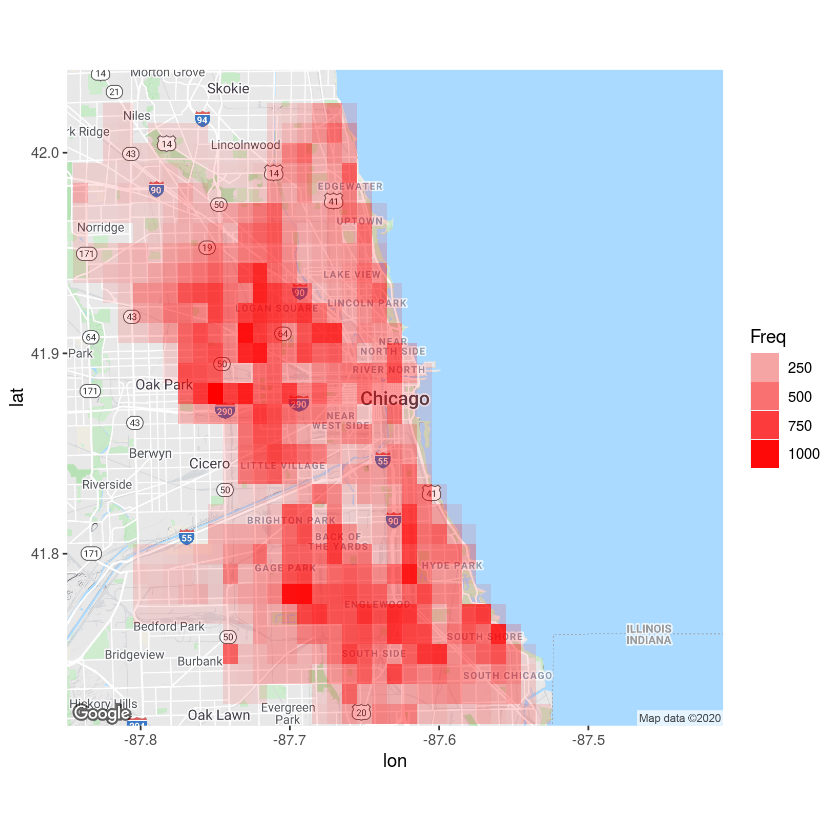

In [44]:
ggmap(chicago) + 
geom_tile(data=LatLonCounts2, aes(x=Long, y=Lat, alpha=Freq), fill="red")

In [45]:
str(LatLonCounts2)

'data.frame':	686 obs. of  5 variables:
 $ Var1: Factor w/ 42 levels "-87.93","-87.92",..: 33 40 32 33 34 35 38 39 40 41 ...
 $ Var2: Factor w/ 39 levels "41.64","41.65",..: 1 1 2 2 2 2 2 2 2 2 ...
 $ Freq: int  3 1 54 60 28 1 8 63 81 8 ...
 $ Long: num  -87.6 -87.5 -87.6 -87.6 -87.6 ...
 $ Lat : num  41.6 41.6 41.6 41.6 41.6 ...


In [46]:
str(LatLonCounts)

'data.frame':	1638 obs. of  5 variables:
 $ Var1: Factor w/ 42 levels "-87.93","-87.92",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Var2: Factor w/ 39 levels "41.64","41.65",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Freq: int  0 0 0 0 0 0 0 0 0 0 ...
 $ Long: num  -87.9 -87.9 -87.9 -87.9 -87.9 ...
 $ Lat : num  41.6 41.6 41.6 41.6 41.6 ...


In [47]:
1638 - 686

[1] 952

## A Heatmap on the United States


This data is provided by the U.S. Census Bureau and the FBI, and is decribed [here](http://en.wikipedia.org/wiki/Gun_violence_in_the_United_States_by_state).

In [90]:
murders = read.csv("./dataset/murders.csv")
str(murders)

'data.frame':	51 obs. of  6 variables:
 $ State            : Factor w/ 51 levels "Alabama","Alaska",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Population       : int  4779736 710231 6392017 2915918 37253956 5029196 3574097 897934 601723 19687653 ...
 $ PopulationDensity: num  94.65 1.26 57.05 56.43 244.2 ...
 $ Murders          : int  199 31 352 130 1811 117 131 48 131 987 ...
 $ GunMurders       : int  135 19 232 93 1257 65 97 38 99 669 ...
 $ GunOwnership     : num  0.517 0.578 0.311 0.553 0.213 0.347 0.167 0.255 0.036 0.245 ...


In [91]:
statesMap = map_data("state")

In [92]:
str(statesMap)

'data.frame':	15537 obs. of  6 variables:
 $ long     : num  -87.5 -87.5 -87.5 -87.5 -87.6 ...
 $ lat      : num  30.4 30.4 30.4 30.3 30.3 ...
 $ group    : num  1 1 1 1 1 1 1 1 1 1 ...
 $ order    : int  1 2 3 4 5 6 7 8 9 10 ...
 $ region   : chr  "alabama" "alabama" "alabama" "alabama" ...
 $ subregion: chr  NA NA NA NA ...


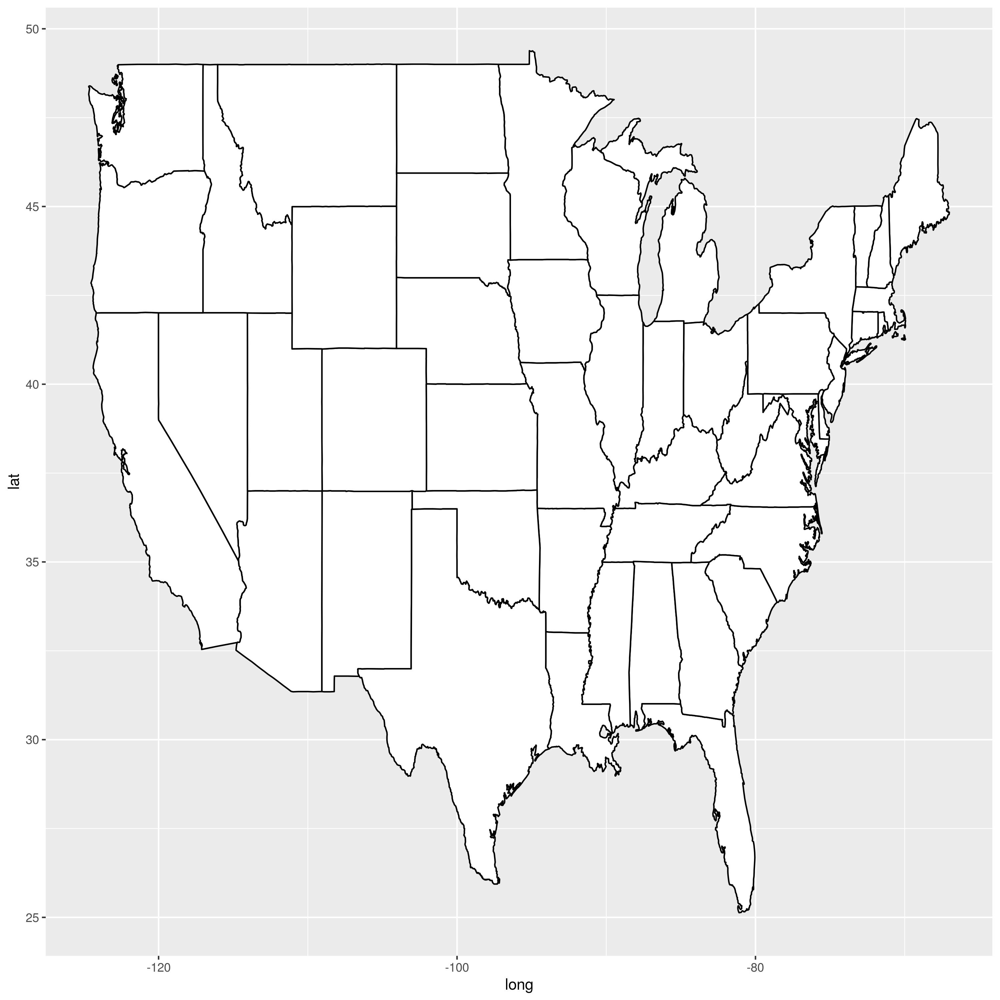

In [93]:
ggplot(statesMap, aes(x=long, y=lat, group=group)) +
geom_polygon(fill="white", color="black")

In [94]:
murders$region = tolower(murders$State)

In [95]:
murderMap = merge(statesMap, murders, by="region")

In [96]:
str(murderMap)

'data.frame':	15537 obs. of  12 variables:
 $ region           : chr  "alabama" "alabama" "alabama" "alabama" ...
 $ long             : num  -87.5 -87.5 -87.5 -87.5 -87.6 ...
 $ lat              : num  30.4 30.4 30.4 30.3 30.3 ...
 $ group            : num  1 1 1 1 1 1 1 1 1 1 ...
 $ order            : int  1 2 3 4 5 6 7 8 9 10 ...
 $ subregion        : chr  NA NA NA NA ...
 $ State            : Factor w/ 51 levels "Alabama","Alaska",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Population       : int  4779736 4779736 4779736 4779736 4779736 4779736 4779736 4779736 4779736 4779736 ...
 $ PopulationDensity: num  94.7 94.7 94.7 94.7 94.7 ...
 $ Murders          : int  199 199 199 199 199 199 199 199 199 199 ...
 $ GunMurders       : int  135 135 135 135 135 135 135 135 135 135 ...
 $ GunOwnership     : num  0.517 0.517 0.517 0.517 0.517 0.517 0.517 0.517 0.517 0.517 ...


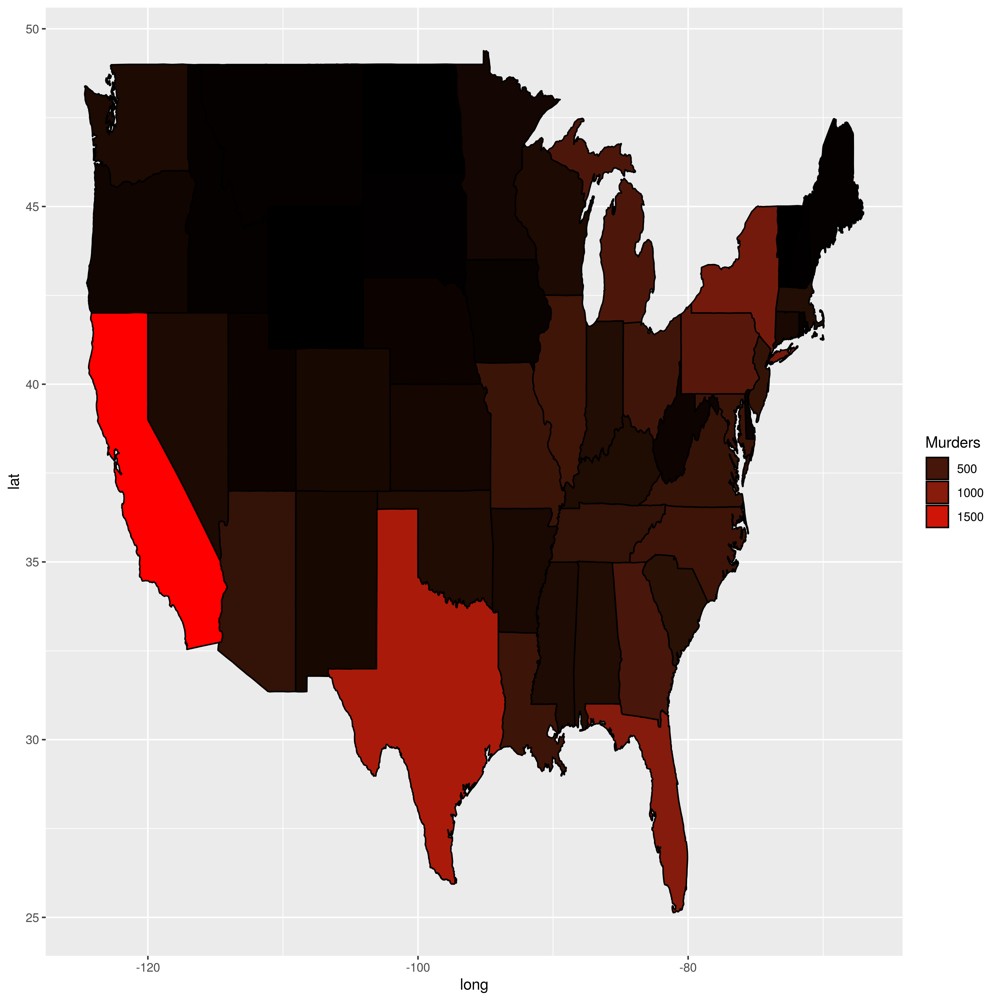

In [97]:
ggplot(murderMap, aes(x=long, y=lat, group=group, fill=Murders)) + 
geom_polygon(color="black") + 
scale_fill_gradient(low="black", high="red", guide="legend")

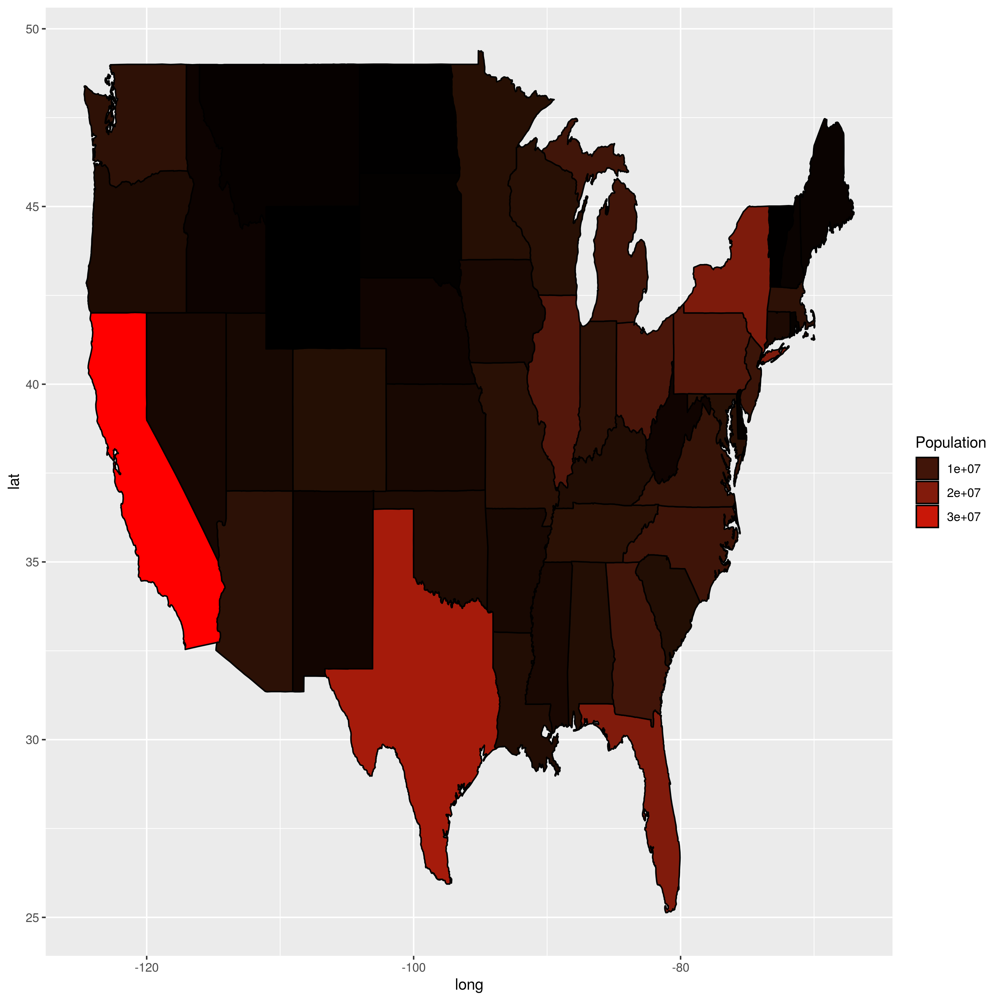

In [99]:
ggplot(murderMap, aes(x=long, y=lat, group=group, fill=Population)) + 
geom_polygon(color="black") + 
scale_fill_gradient(low="black", high="red", guide="legend")

In [106]:
c

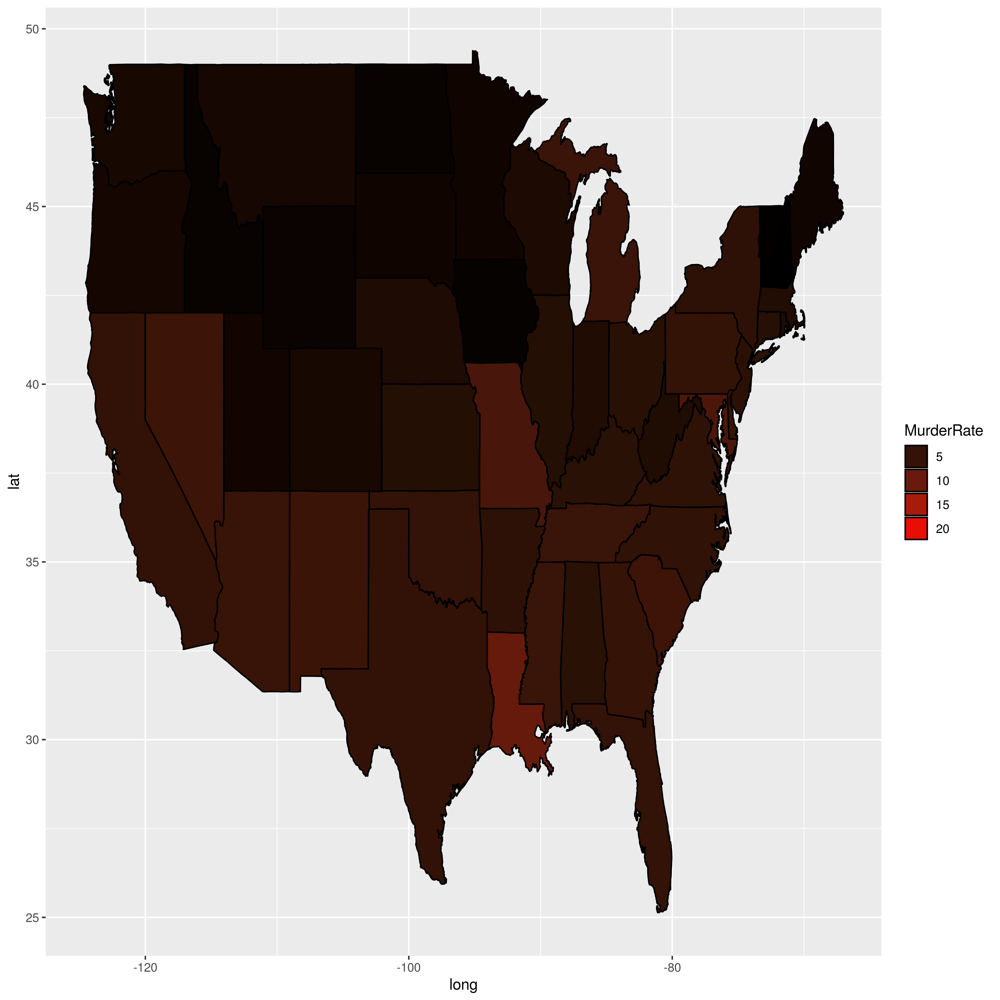

In [107]:
ggplot(murderMap, aes(x=long, y=lat, group=group, fill=MurderRate)) + 
geom_polygon(color="black") + 
scale_fill_gradient(low="black", high="red", guide="legend")

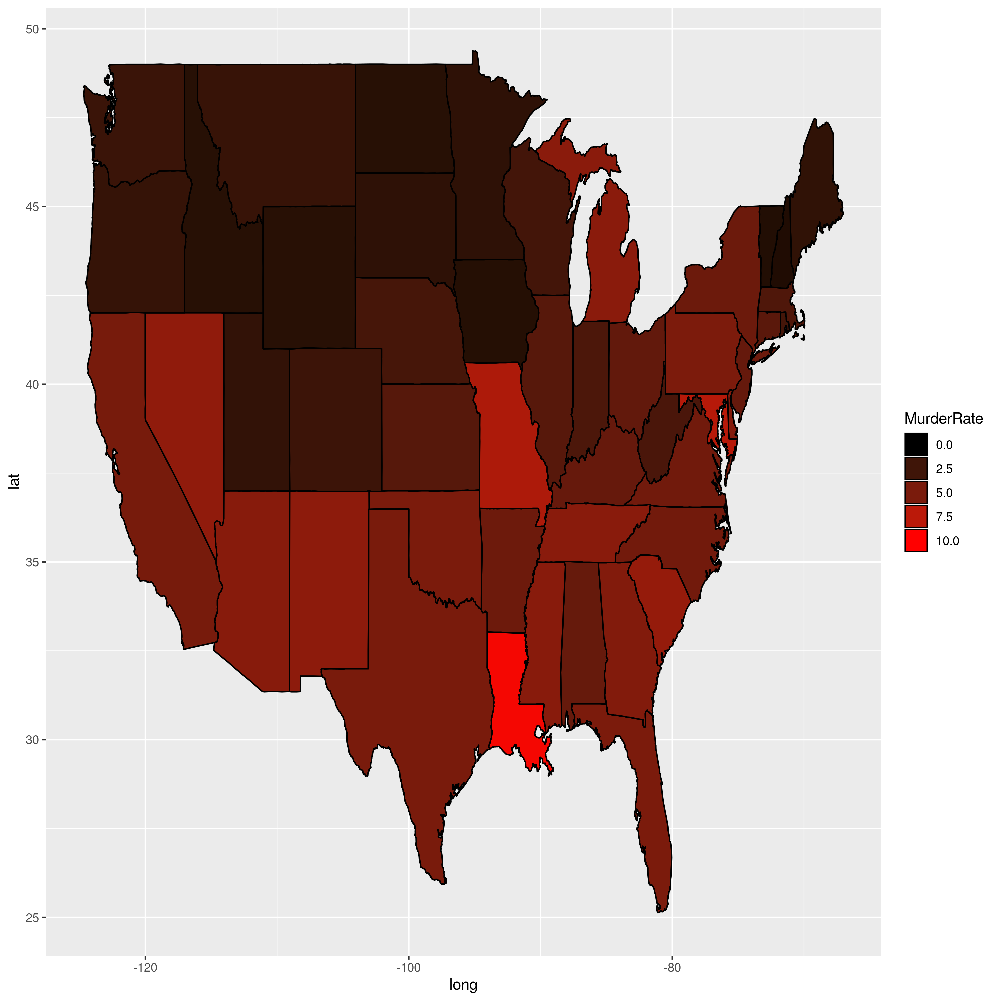

In [108]:
ggplot(murderMap, aes(x = long, y = lat, group = group, fill = MurderRate)) + 
geom_polygon(color = "black") + 
scale_fill_gradient(low = "black", high = "red", guide = "legend", limits = c(0,10))

In [84]:
usa = get_map(location="usa", zoom=4)

Source : https://maps.googleapis.com/maps/api/staticmap?center=usa&zoom=4&size=640x640&scale=2&maptype=terrain&language=en-EN&key=xxx

Source : https://maps.googleapis.com/maps/api/geocode/json?address=usa&key=xxx



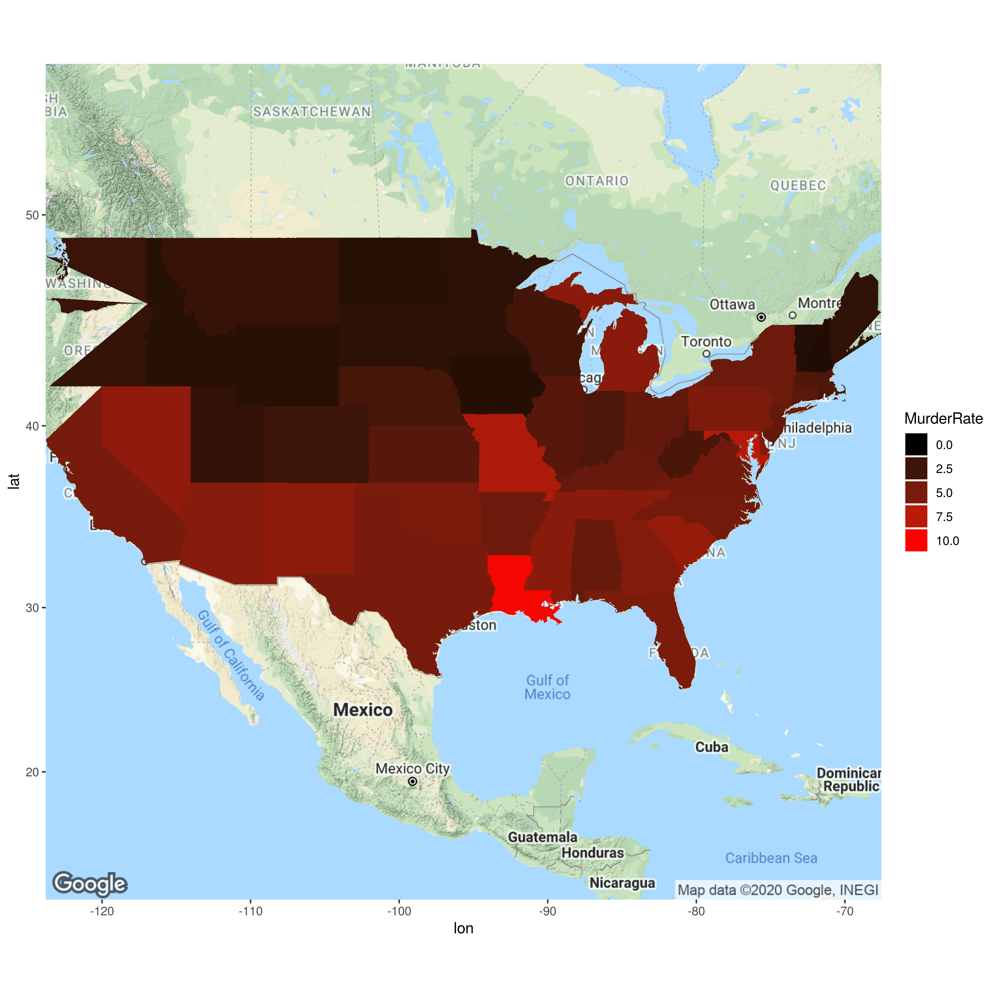

In [109]:
ggmap(usa) + 
geom_polygon(data=murderMap, aes(x=long, y=lat, group=group, fill=MurderRate)) + 
scale_fill_gradient(low = "black", high = "red", guide = "legend",limits = c(0,10))

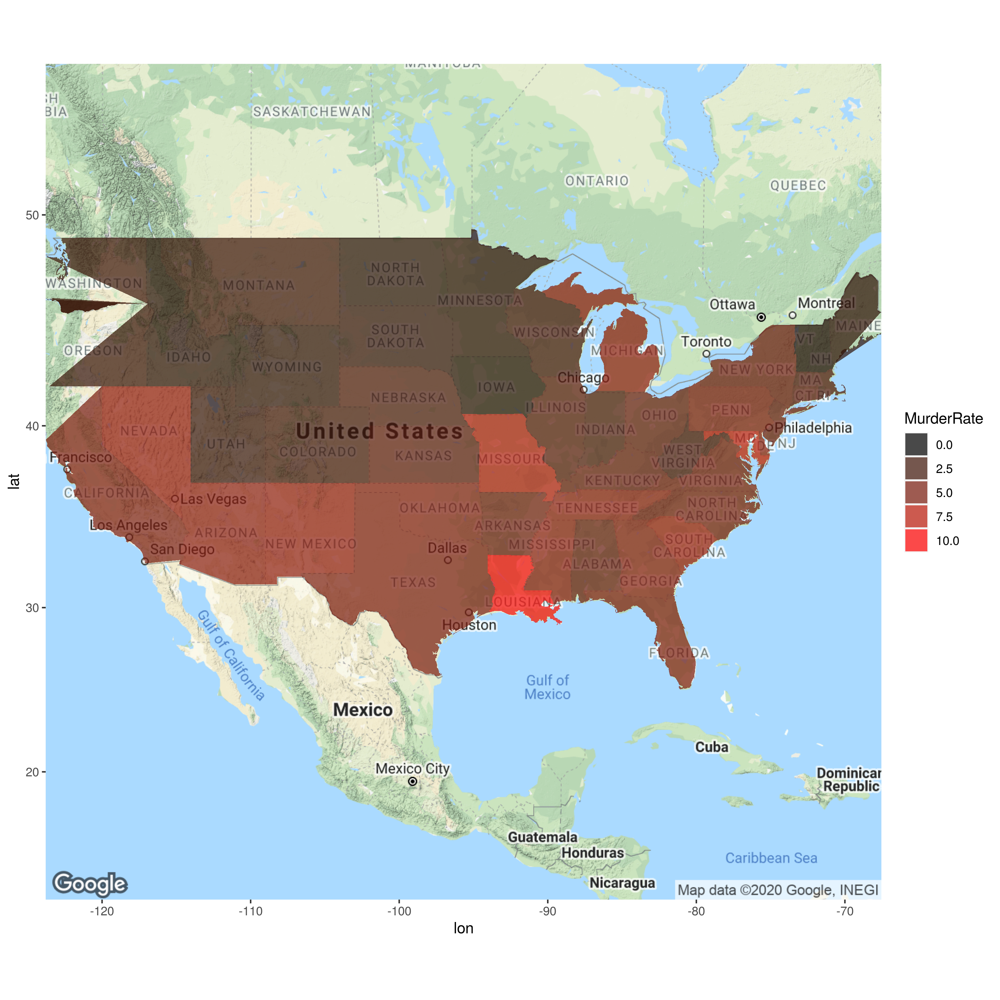

In [119]:
ggmap(usa) + 
geom_polygon(data=murderMap, aes(x=long, y=lat, group=group, fill=MurderRate), alpha=0.7) + 
scale_fill_gradient(low = "black", high = "red", guide = "legend",limits = c(0,10))

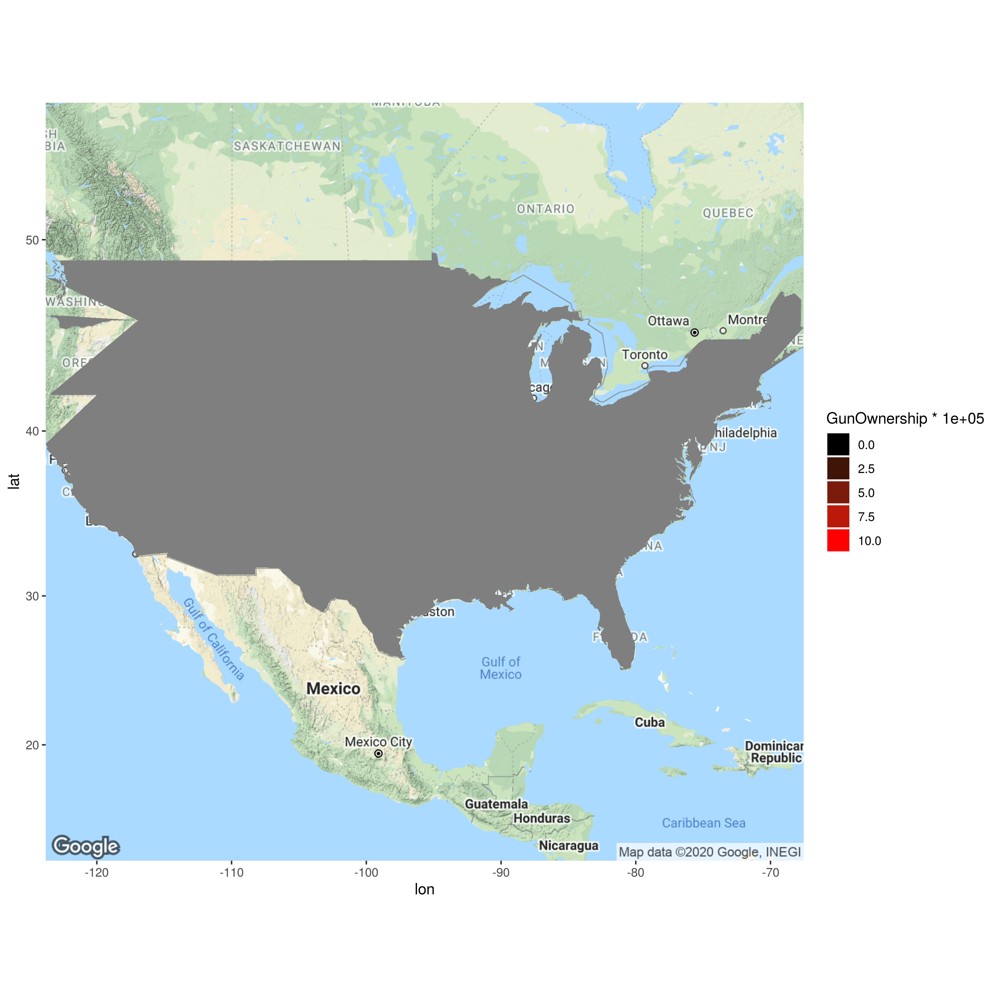

In [122]:
ggmap(usa) + 
geom_polygon(data=murderMap, aes(x=long, y=lat, group=group, fill=GunOwnership*100000)) + 
scale_fill_gradient(low = "black", high = "red", guide = "legend",limits = c(0,10))

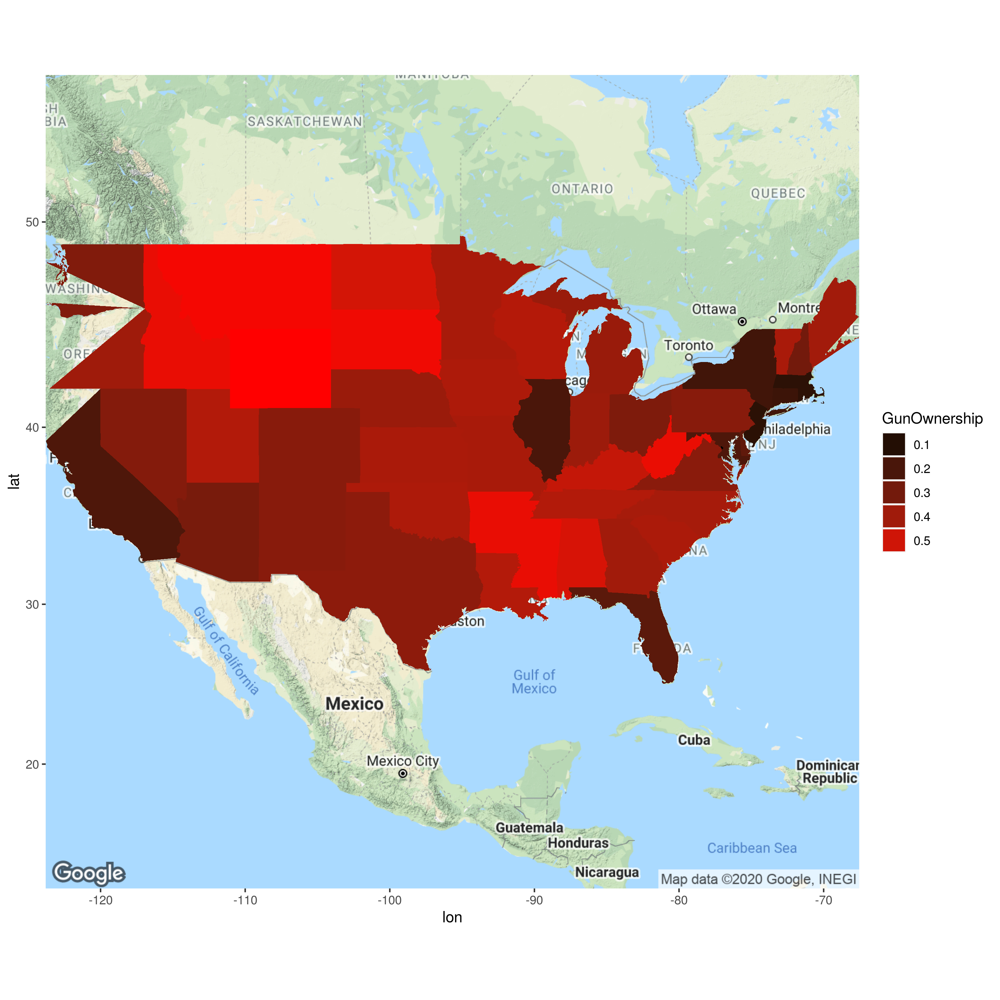

In [125]:
ggmap(usa) + 
geom_polygon(data=murderMap, aes(x=long, y=lat, group=group, fill=GunOwnership)) + 
scale_fill_gradient(low = "black", high = "red", guide = "legend")